In [3]:
import torchvision as tv
import phototour
import torch
from tqdm import tqdm 
import numpy as np
import torch.nn as nn
import math 
import tfeat_model
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import os


In [4]:
#init tfeat and load the trained weights
tfeat = tfeat_model.TNet()
models_path = '../pretrained-models'
net_name = 'tfeat-liberty'
tfeat.load_state_dict(torch.load(os.path.join(models_path,net_name+".params")))
# tfeat.cuda()
tfeat.eval()
all_good_matches = []

(1024, 768)
<class 'numpy.ndarray'>
94


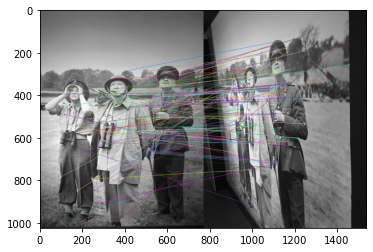

CPU times: user 1.08 s, sys: 29.9 ms, total: 1.11 s
Wall time: 1.03 s


(<matplotlib.image.AxesImage at 0x7fe982781e50>, None)

In [6]:
%%time

import cv2
import tfeat_utils
import numpy as np
import cv2
from matplotlib import pyplot as plt


img1 = cv2.imread('../imgs/v_churchill/1.ppm',0) 
img2 = cv2.imread('../imgs/v_churchill/6.ppm',0)
print(img1.shape)
brisk = cv2.BRISK_create()
kp1, des1 = brisk.detectAndCompute(img1,None)
print(type(des1))
kp2, des2 = brisk.detectAndCompute(img2,None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1,des2, k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])
print(len(good))      
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
plt.imshow(img3),plt.show()

<class 'mat.Mat'>
76


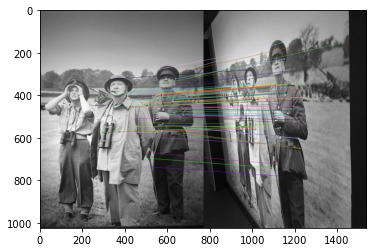

CPU times: user 4.1 s, sys: 645 ms, total: 4.74 s
Wall time: 1.65 s


(<matplotlib.image.AxesImage at 0x7fe982676d10>, None)

In [10]:
%%time

# mag_factor is how many times the original keypoint scale
# is enlarged to generate a patch from a keypoint
import sys
sys.path.append('/home/h/vslam_ws/ORB_SLAM2/Thirdparty/opencv-swig/test/build')
import mat

mag_factor = 3
desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)

m = mat.Mat.from_array(desc_tfeat1) 

# desc_tfeat1_mat = cv.fromarray(desc_tfeat1)
print(type(m))
desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

bf = cv2.BFMatcher(cv2.NORM_L2)
matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

print(len(good))
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

plt.imshow(img3),plt.show()

********************************************************************
28


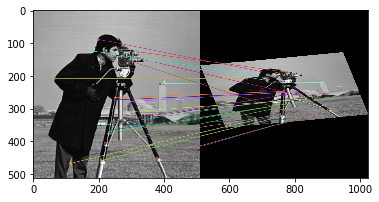

53


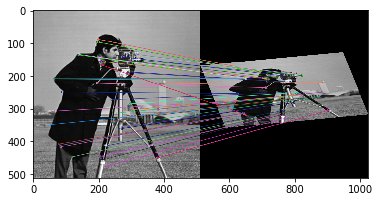

##########################################################################
39


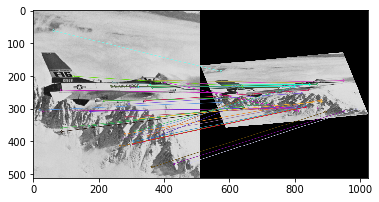

61


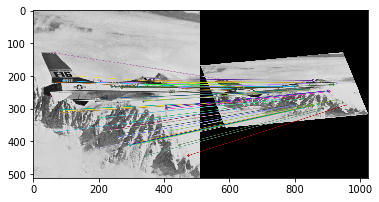

##########################################################################
25


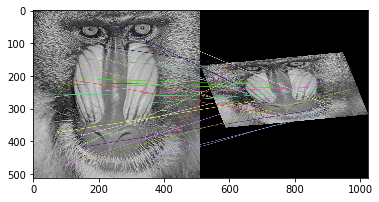

37


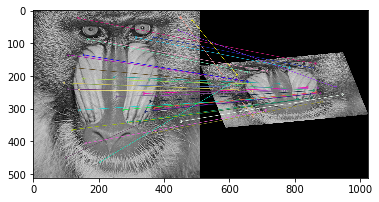

##########################################################################
24


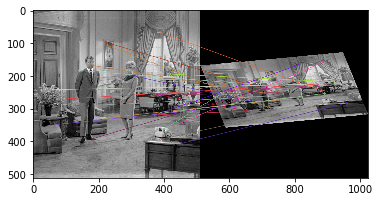

48


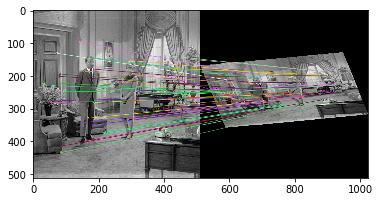

##########################################################################
17


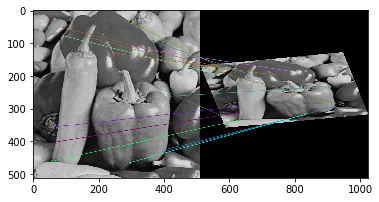

45


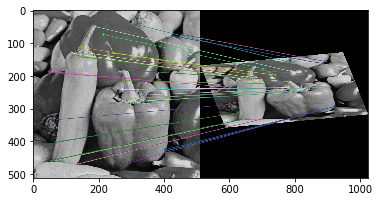

##########################################################################
39


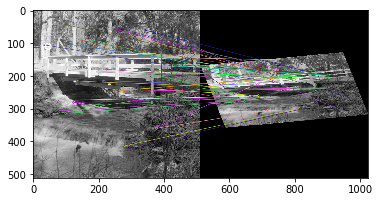

45


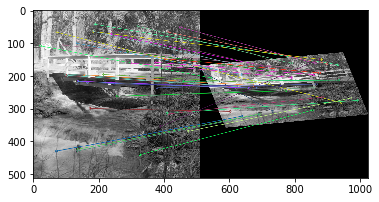

##########################################################################
13


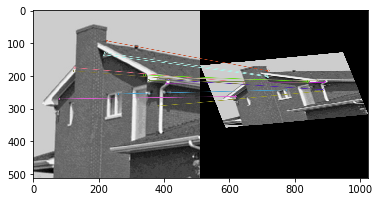

33


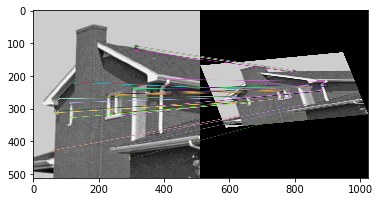

##########################################################################
17


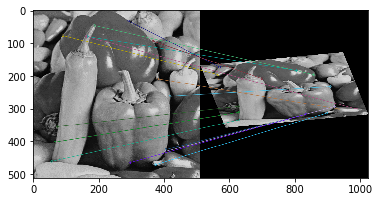

46


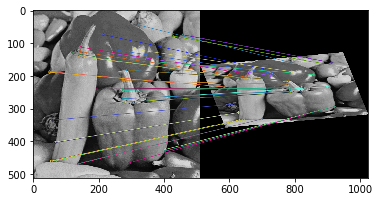

##########################################################################
29


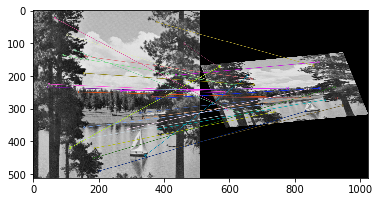

43


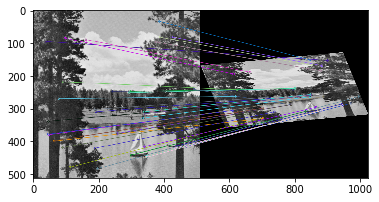

##########################################################################
33


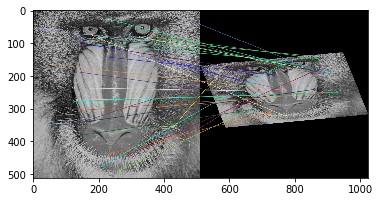

54


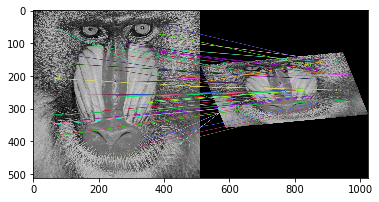

##########################################################################
38


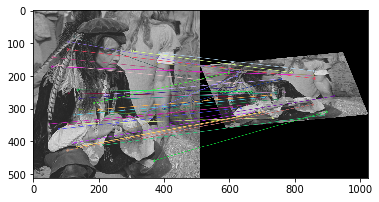

56


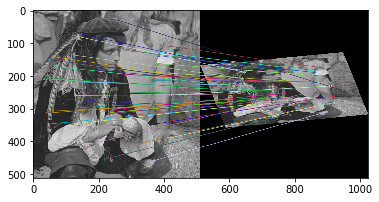

##########################################################################
[[(28, 53), (39, 61), (25, 37), (24, 48), (17, 45), (39, 45), (13, 33), (17, 46), (29, 43), (33, 54), (38, 56)]]


In [21]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        brisk = cv2.BRISK_create()
        kp1, des1 = brisk.detectAndCompute(img1,None)
        kp2, des2 = brisk.detectAndCompute(img2,None)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good)) 
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher(cv2.NORM_L2)
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

[[([[<DMatch 000001C91FB62950>], [<DMatch 000001C91FB62770>], [<DMatch 000001C91C92D4F0>], [<DMatch 000001C91FBE72B0>], [<DMatch 000001C91EA61A50>], [<DMatch 000001C91EA61190>], [<DMatch 000001C91EA202F0>], [<DMatch 000001C91EA20870>], [<DMatch 000001C91EA20E30>], [<DMatch 000001C91EA206F0>], [<DMatch 000001C91F5ED570>], [<DMatch 000001C91F5EDE50>], [<DMatch 000001C91F5ED4F0>], [<DMatch 000001C91F5EDF50>], [<DMatch 000001C91FBFE150>], [<DMatch 000001C91FBFE550>], [<DMatch 000001C91F952830>], [<DMatch 000001C91C87CD30>], [<DMatch 000001C91C8762B0>], [<DMatch 000001C91C8763B0>], [<DMatch 000001C91C8764F0>], [<DMatch 000001C91C876730>], [<DMatch 000001C91C866270>], [<DMatch 000001C91C9D27F0>], [<DMatch 000001C91C9C1C30>], [<DMatch 000001C91F99E3B0>], [<DMatch 000001C91F9C64F0>], [<DMatch 000001C91F99D270>]], [[<DMatch 000001C92198F210>], [<DMatch 000001C91C998B10>], [<DMatch 000001C91C998950>], [<DMatch 000001C91F93CD30>], [<DMatch 000001C91F93CC90>], [<DMatch 000001C91C950770>], [<DMatch

105


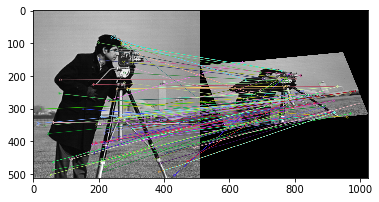

97


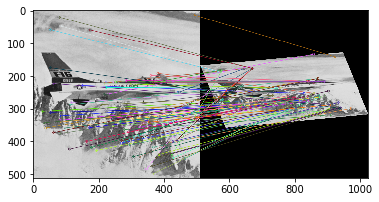

72


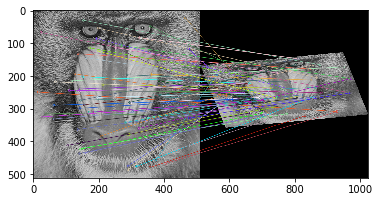

130


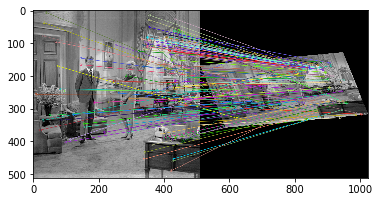

67


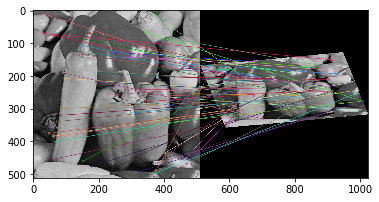

97


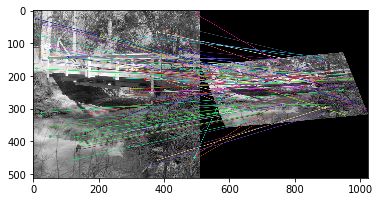

66


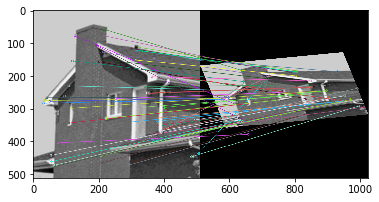

65


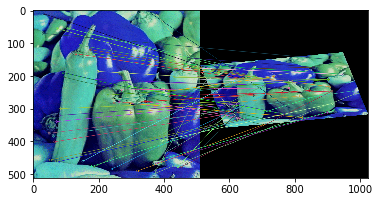

111


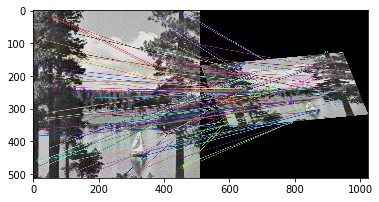

51


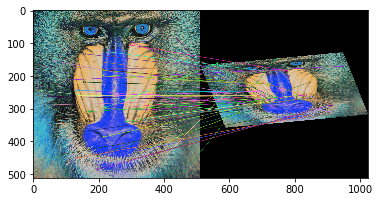

95


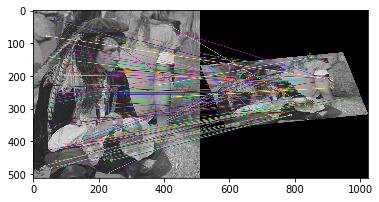

In [13]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1

for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)

        ##bf = cv2.BFMatcher(cv2.NORM_HAMMING)
        ##matches = bf.knnMatch(des1,des2, k=2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))      
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        
        

********************************************************************
105


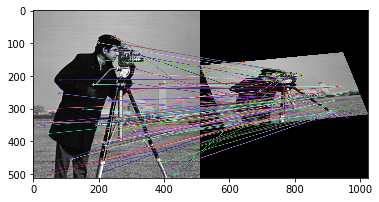

118


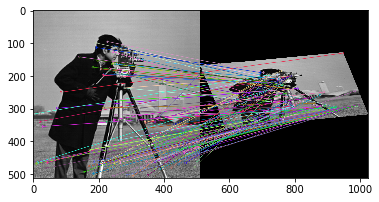

##########################################################################
97


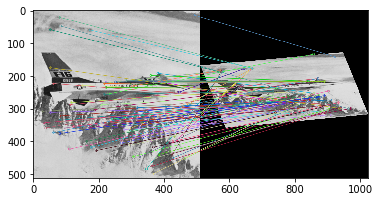

75


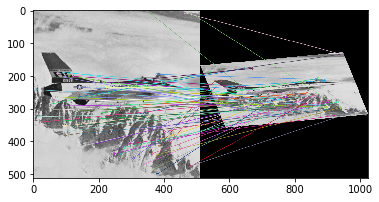

##########################################################################
72


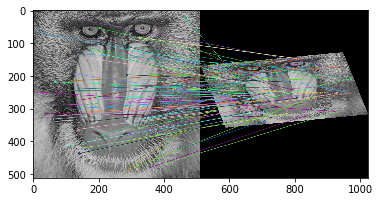

283


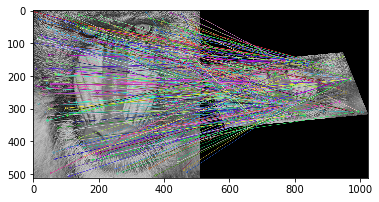

##########################################################################
130


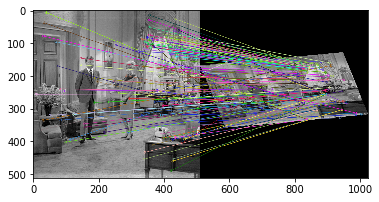

97


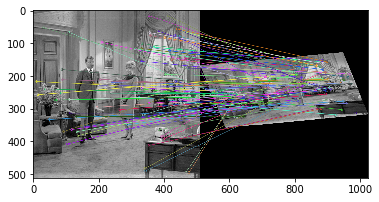

##########################################################################
67


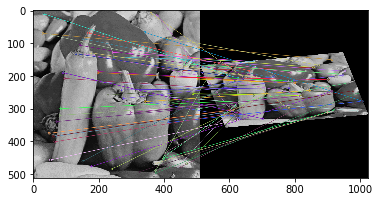

40


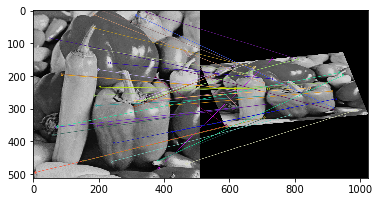

##########################################################################
97


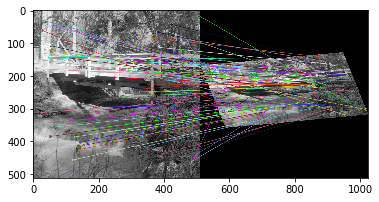

69


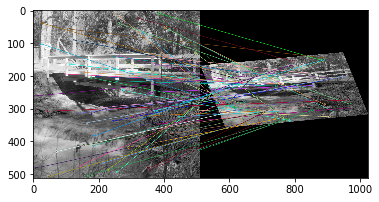

##########################################################################
66


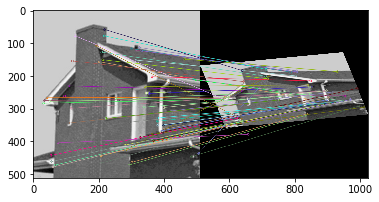

31


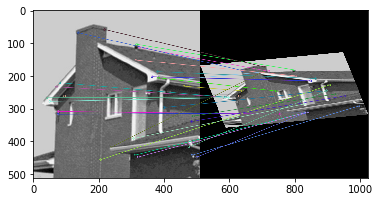

##########################################################################
65


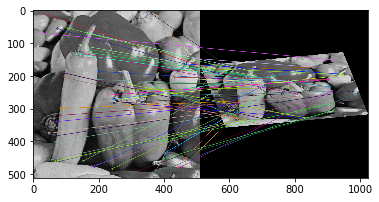

37


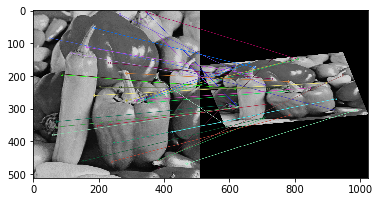

##########################################################################
111


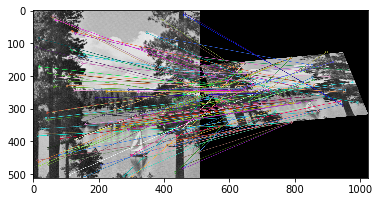

78


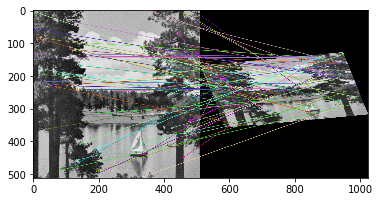

##########################################################################
51


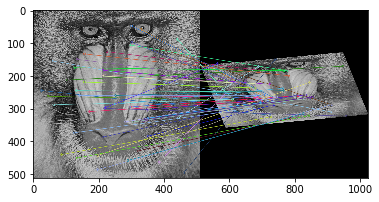

51


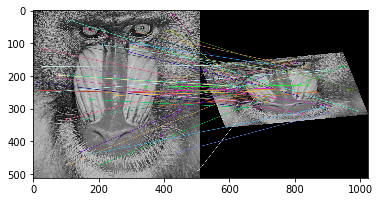

##########################################################################
95


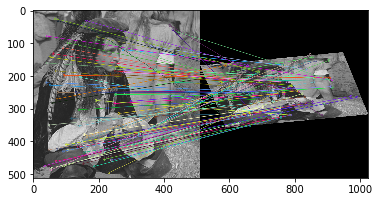

55


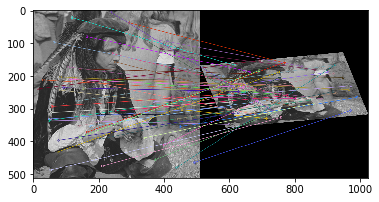

##########################################################################
[[(28, 53), (39, 61), (25, 37), (24, 48), (17, 45), (39, 45), (13, 33), (17, 46), (29, 43), (33, 54), (38, 56)], [(105, 118), (97, 75), (72, 283), (130, 97), (67, 40), (97, 69), (66, 31), (65, 37), (111, 78), (51, 51), (95, 55)]]


In [22]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
131


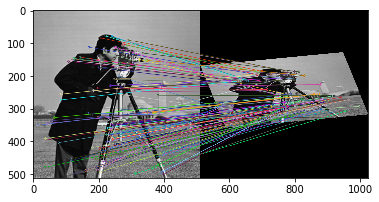

64


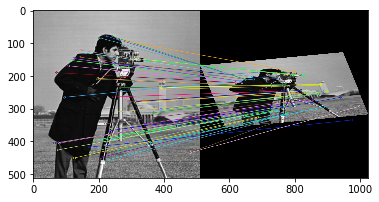

##########################################################################
102


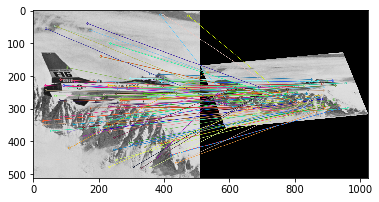

39


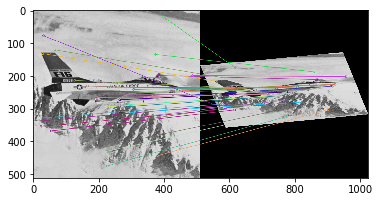

##########################################################################
133


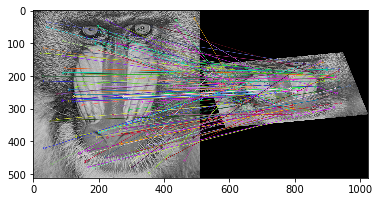

61


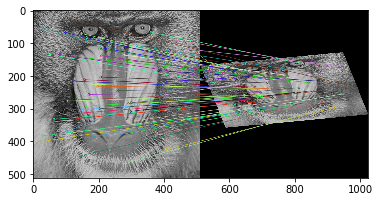

##########################################################################
176


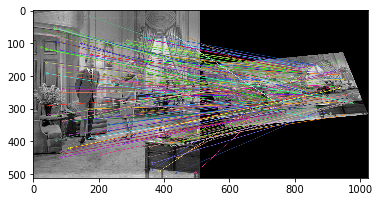

82


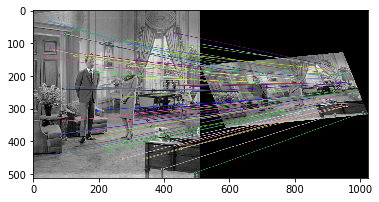

##########################################################################
152


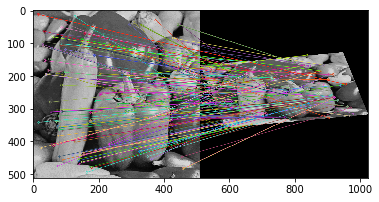

62


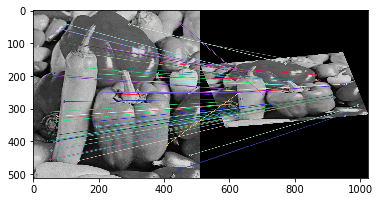

##########################################################################
115


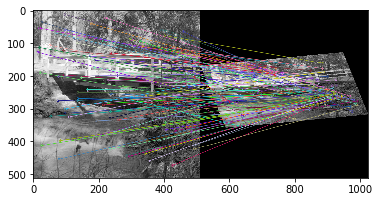

38


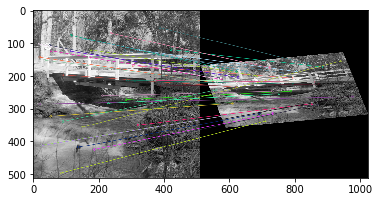

##########################################################################
140


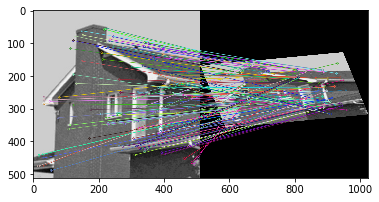

65


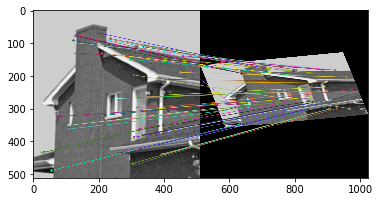

##########################################################################
144


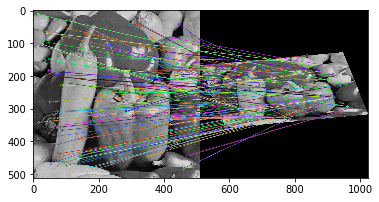

63


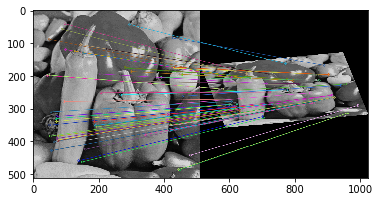

##########################################################################
115


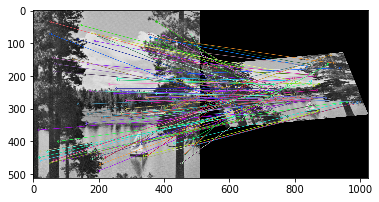

25


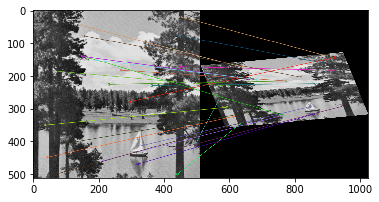

##########################################################################
159


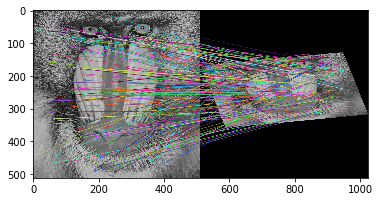

70


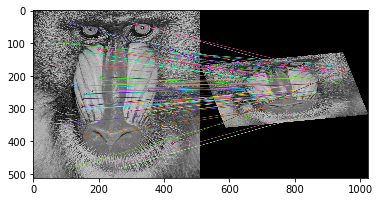

##########################################################################
141


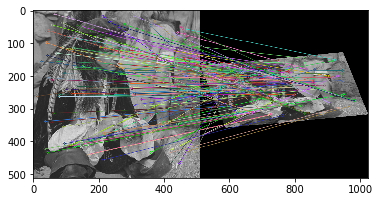

63


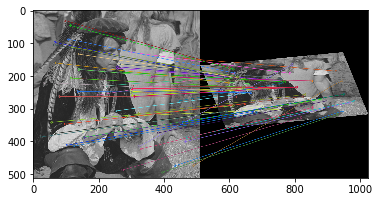

##########################################################################
[[(28, 53), (39, 61), (25, 37), (24, 48), (17, 45), (39, 45), (13, 33), (17, 46), (29, 43), (33, 54), (38, 56)], [(105, 118), (97, 75), (72, 283), (130, 97), (67, 40), (97, 69), (66, 31), (65, 37), (111, 78), (51, 51), (95, 55)], [(131, 64), (102, 39), (133, 61), (176, 82), (152, 62), (115, 38), (140, 65), (144, 63), (115, 25), (159, 70), (141, 63)]]


In [23]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        surf = cv2.xfeatures2d.SURF_create()
        kp1, des1 = surf.detectAndCompute(img1,None)
        kp2, des2 = surf.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
34


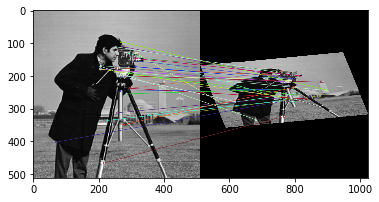

4


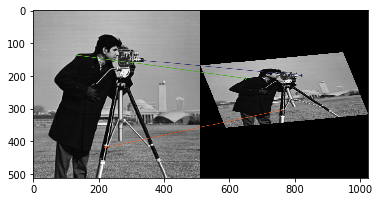

##########################################################################
36


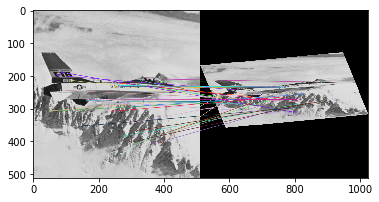

8


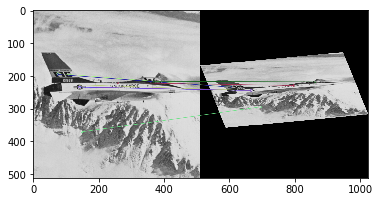

##########################################################################
26


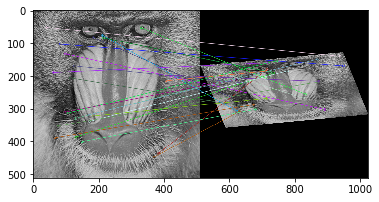

12


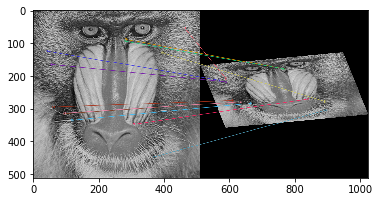

##########################################################################
41


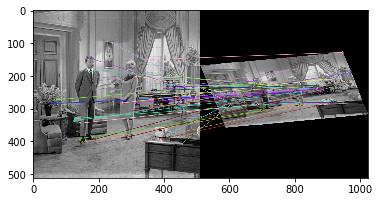

14


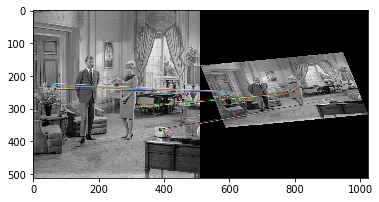

##########################################################################
52


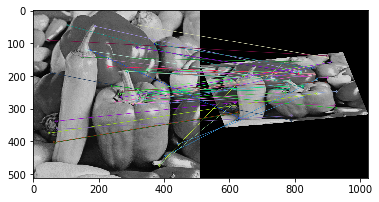

2


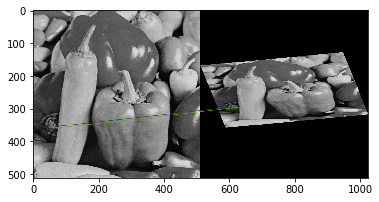

##########################################################################
32


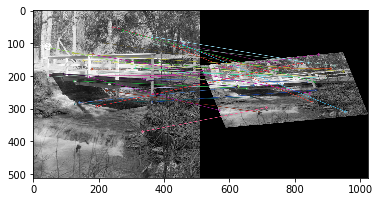

13


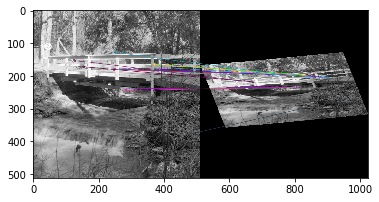

##########################################################################
22


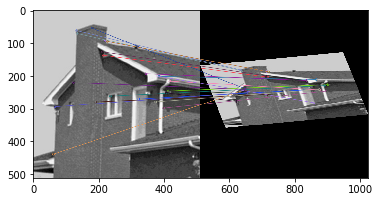

31


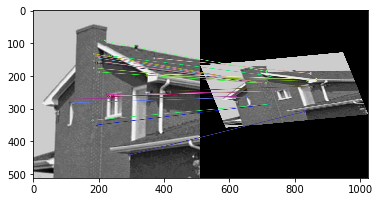

##########################################################################
56


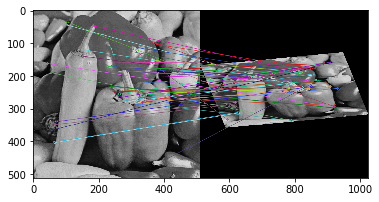

3


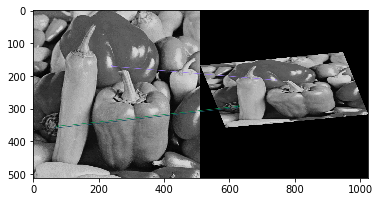

##########################################################################
42


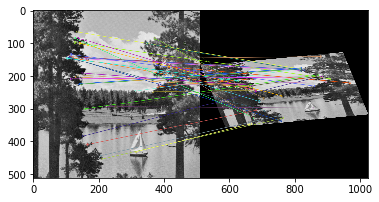

5


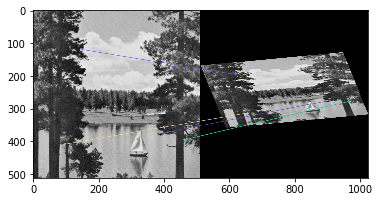

##########################################################################
22


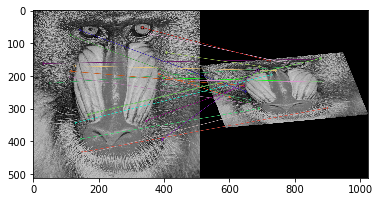

15


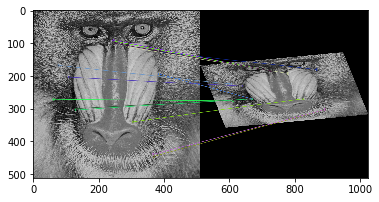

##########################################################################
53


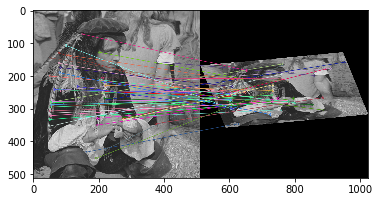

6


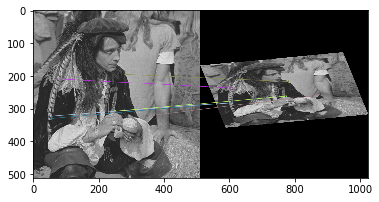

##########################################################################
[[(28, 53), (39, 61), (25, 37), (24, 48), (17, 45), (39, 45), (13, 33), (17, 46), (29, 43), (33, 54), (38, 56)], [(105, 118), (97, 75), (72, 283), (130, 97), (67, 40), (97, 69), (66, 31), (65, 37), (111, 78), (51, 51), (95, 55)], [(131, 64), (102, 39), (133, 61), (176, 82), (152, 62), (115, 38), (140, 65), (144, 63), (115, 25), (159, 70), (141, 63)], [(34, 4), (36, 8), (26, 12), (41, 14), (52, 2), (32, 13), (22, 31), (56, 3), (42, 5), (22, 15), (53, 6)]]


In [24]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        orb = cv2.ORB_create(nfeatures=1500)
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
23


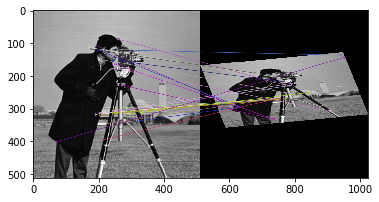

26


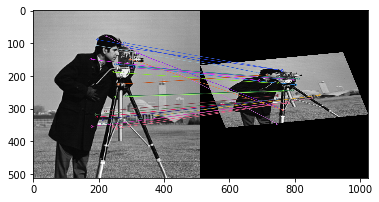

##########################################################################
31


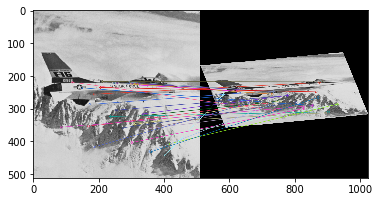

22


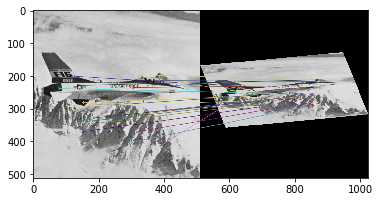

##########################################################################
20


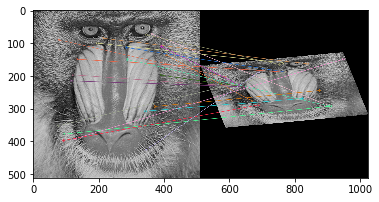

7


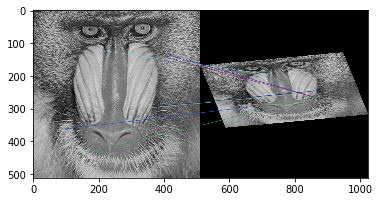

##########################################################################
15


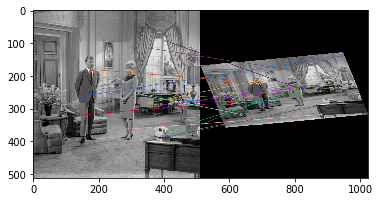

19


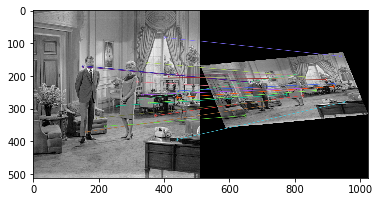

##########################################################################
14


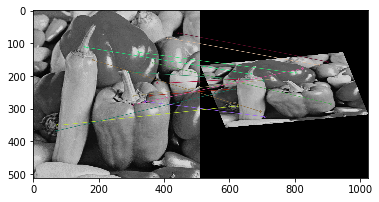

18


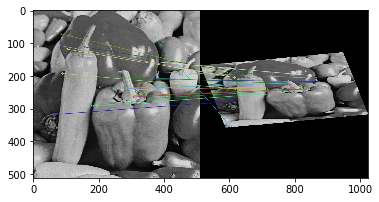

##########################################################################
22


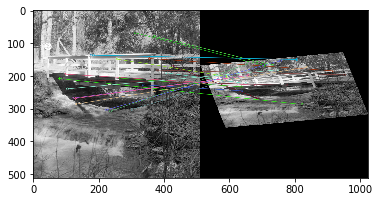

17


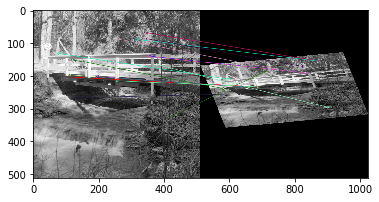

##########################################################################
7


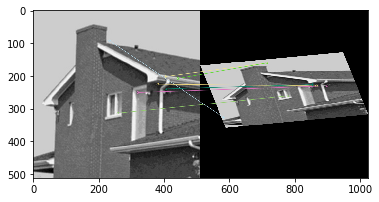

11


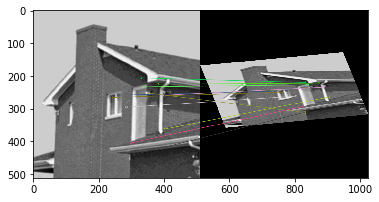

##########################################################################
15


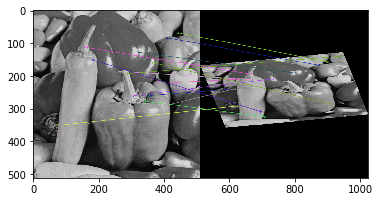

19


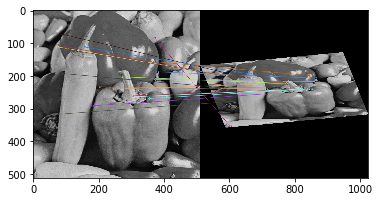

##########################################################################
27


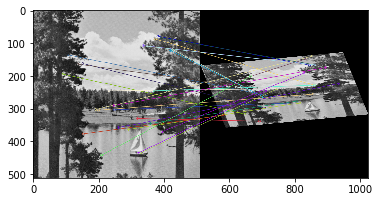

13


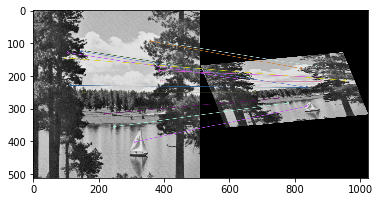

##########################################################################
22


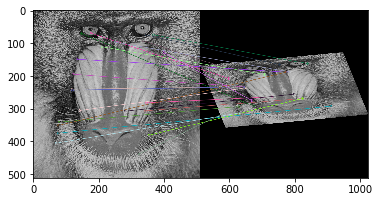

13


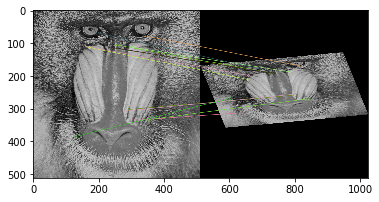

##########################################################################
17


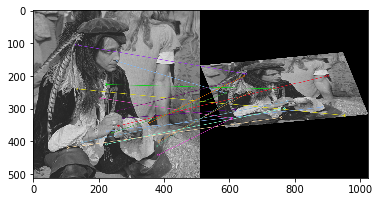

23


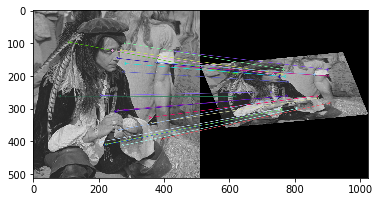

##########################################################################
[[(28, 53), (39, 61), (25, 37), (24, 48), (17, 45), (39, 45), (13, 33), (17, 46), (29, 43), (33, 54), (38, 56)], [(105, 118), (97, 75), (72, 283), (130, 97), (67, 40), (97, 69), (66, 31), (65, 37), (111, 78), (51, 51), (95, 55)], [(131, 64), (102, 39), (133, 61), (176, 82), (152, 62), (115, 38), (140, 65), (144, 63), (115, 25), (159, 70), (141, 63)], [(34, 4), (36, 8), (26, 12), (41, 14), (52, 2), (32, 13), (22, 31), (56, 3), (42, 5), (22, 15), (53, 6)], [(23, 26), (31, 22), (20, 7), (15, 19), (14, 18), (22, 17), (7, 11), (15, 19), (27, 13), (22, 13), (17, 23)]]


In [26]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("../standard_test_images"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        # Initiate FAST detector
        star = cv2.xfeatures2d.StarDetector_create()
        # Initiate BRIEF extractor
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        # find the keypoints with STAR
        kp1 = star.detect(img1,None)
        kp2 = star.detect(img2,None)
        # compute the descriptors with BRIEF
        kp1, des1 = brief.compute(img1, kp1)
        kp2, des2 = brief.compute(img2, kp2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1109


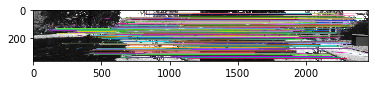

2059


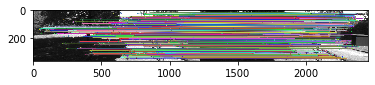

##########################################################################
875


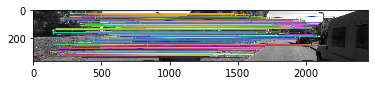

1408


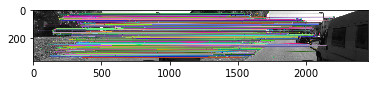

##########################################################################
1626


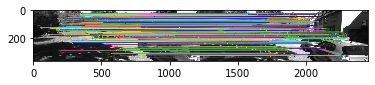

2682


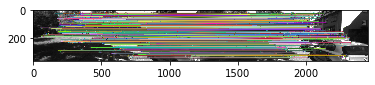

##########################################################################
1400


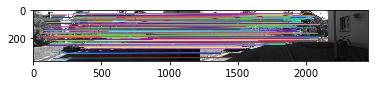

2170


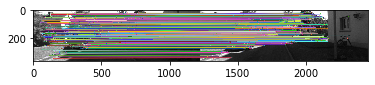

##########################################################################
510


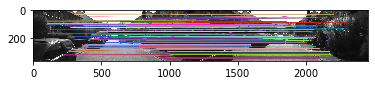

1022


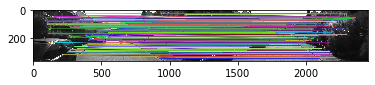

##########################################################################
566


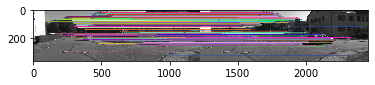

779


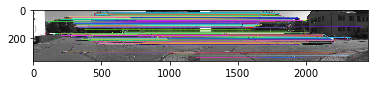

##########################################################################
988


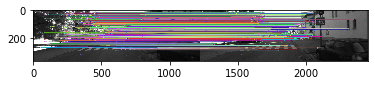

1689


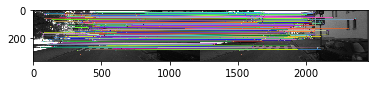

##########################################################################
565


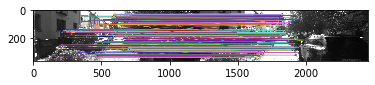

1207


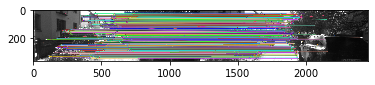

##########################################################################
963


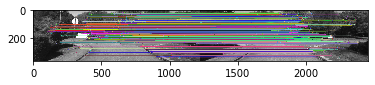

1436


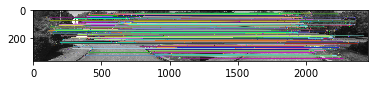

##########################################################################
1050


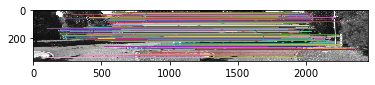

1706


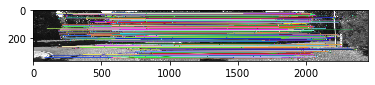

##########################################################################
648


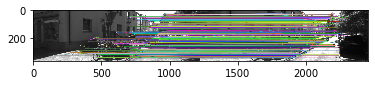

1189


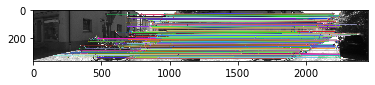

##########################################################################
1248


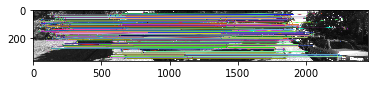

2113


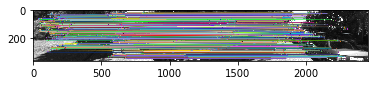

##########################################################################
[[(1109, 2059), (875, 1408), (1626, 2682), (1400, 2170), (510, 1022), (566, 779), (988, 1689), (565, 1207), (963, 1436), (1050, 1706), (648, 1189), (1248, 2113)]]


In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        brisk = cv2.BRISK_create()
        kp1, des1 = brisk.detectAndCompute(img1,None)
        kp2, des2 = brisk.detectAndCompute(img2,None)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good)) 
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher(cv2.NORM_L2)
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1074


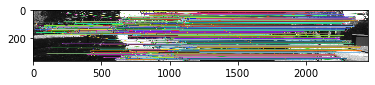

857


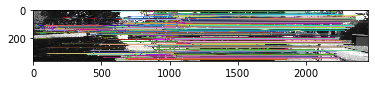

##########################################################################
1094


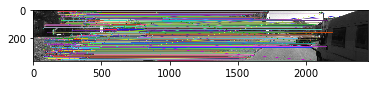

721


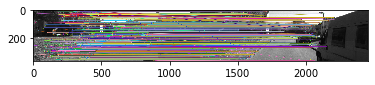

##########################################################################
1497


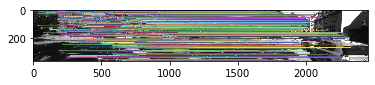

986


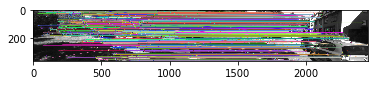

##########################################################################
1292


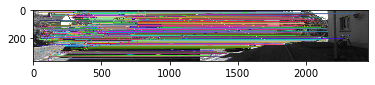

872


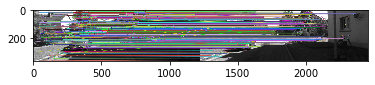

##########################################################################
540


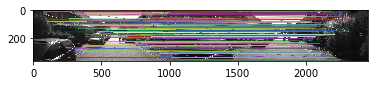

367


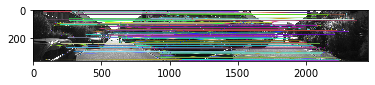

##########################################################################
599


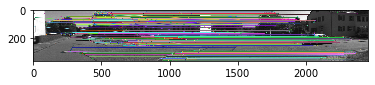

479


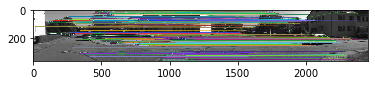

##########################################################################
888


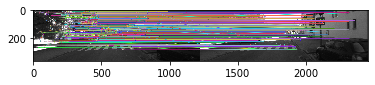

672


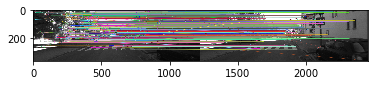

##########################################################################
541


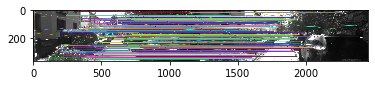

391


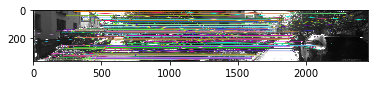

##########################################################################
1424


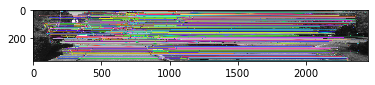

958


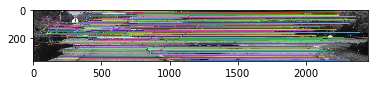

##########################################################################
1146


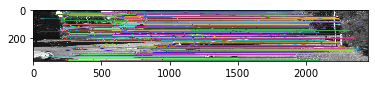

691


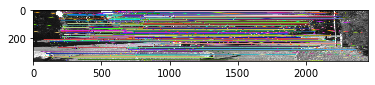

##########################################################################
629


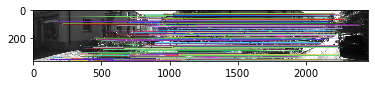

474


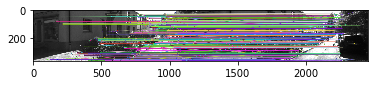

##########################################################################
1262


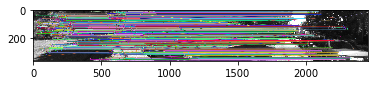

907


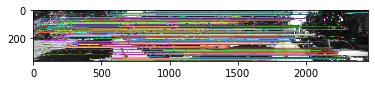

##########################################################################
[[(1109, 2059), (875, 1408), (1626, 2682), (1400, 2170), (510, 1022), (566, 779), (988, 1689), (565, 1207), (963, 1436), (1050, 1706), (648, 1189), (1248, 2113)], [(1074, 857), (1094, 721), (1497, 986), (1292, 872), (540, 367), (599, 479), (888, 672), (541, 391), (1424, 958), (1146, 691), (629, 474), (1262, 907)]]


In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        sift = cv2.xfeatures2d.SIFT_create()
        kp1, des1 = sift.detectAndCompute(img1,None)
        kp2, des2 = sift.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
1149


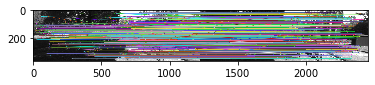

1256


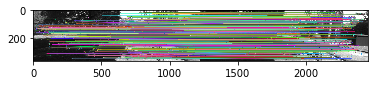

##########################################################################
1104


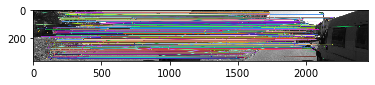

1181


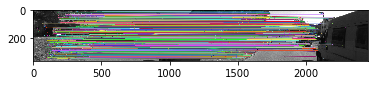

##########################################################################
1355


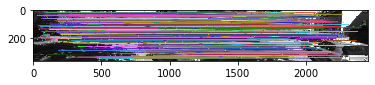

1525


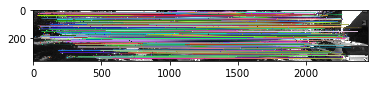

##########################################################################
1412


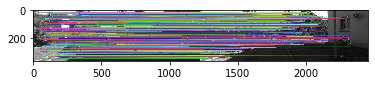

1481


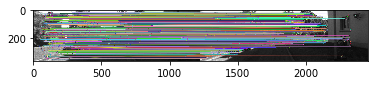

##########################################################################
778


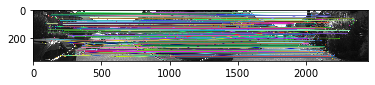

868


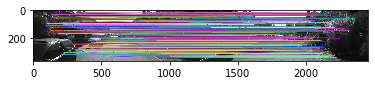

##########################################################################
1168


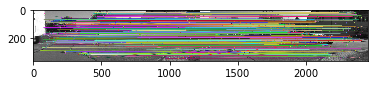

1194


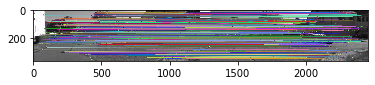

##########################################################################
968


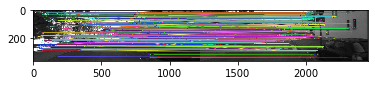

1006


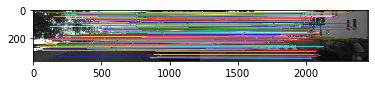

##########################################################################
585


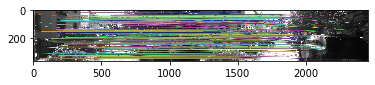

626


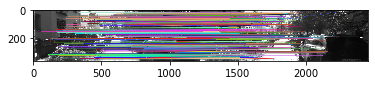

##########################################################################
1389


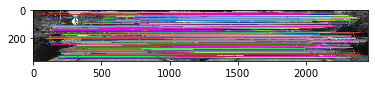

1512


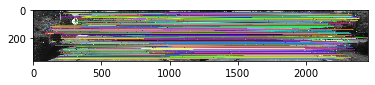

##########################################################################
1248


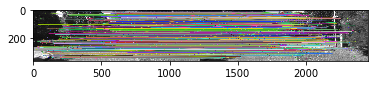

1334


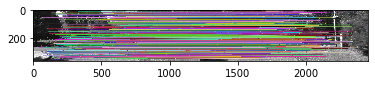

##########################################################################
780


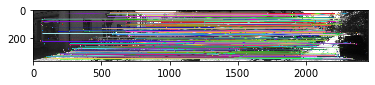

855


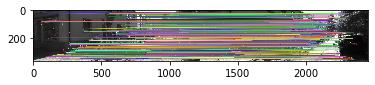

##########################################################################
993


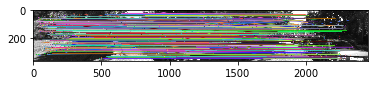

1114


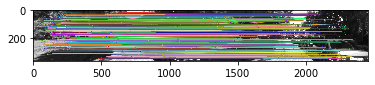

##########################################################################
[[(1109, 2059), (875, 1408), (1626, 2682), (1400, 2170), (510, 1022), (566, 779), (988, 1689), (565, 1207), (963, 1436), (1050, 1706), (648, 1189), (1248, 2113)], [(1074, 857), (1094, 721), (1497, 986), (1292, 872), (540, 367), (599, 479), (888, 672), (541, 391), (1424, 958), (1146, 691), (629, 474), (1262, 907)], [(1149, 1256), (1104, 1181), (1355, 1525), (1412, 1481), (778, 868), (1168, 1194), (968, 1006), (585, 626), (1389, 1512), (1248, 1334), (780, 855), (993, 1114)]]


In [7]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        surf = cv2.xfeatures2d.SURF_create()
        kp1, des1 = surf.detectAndCompute(img1,None)
        kp2, des2 = surf.detectAndCompute(img2,None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
185


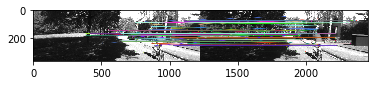

292


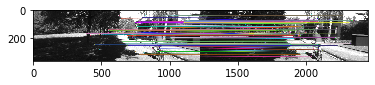

##########################################################################
419


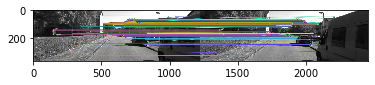

568


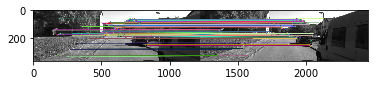

##########################################################################
271


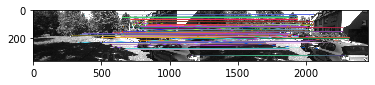

412


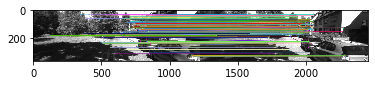

##########################################################################
378


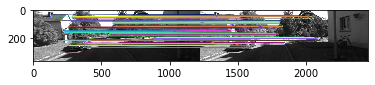

537


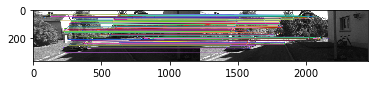

##########################################################################
193


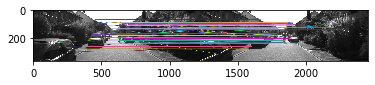

357


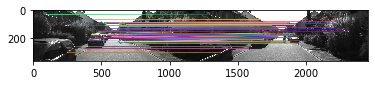

##########################################################################
457


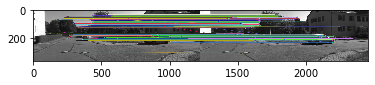

711


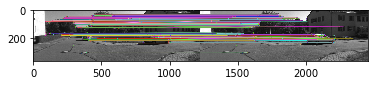

##########################################################################
209


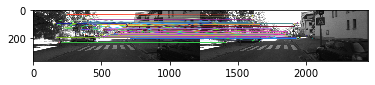

310


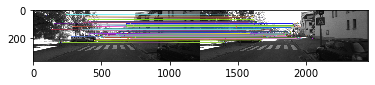

##########################################################################
121


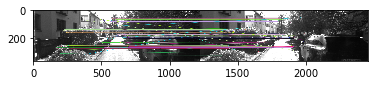

200


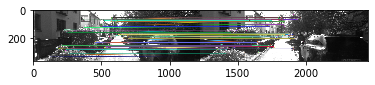

##########################################################################
414


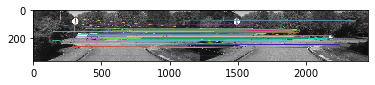

606


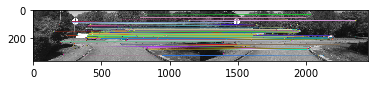

##########################################################################
264


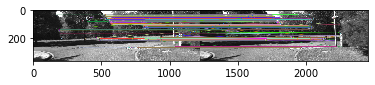

347


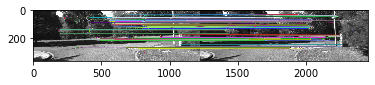

##########################################################################
154


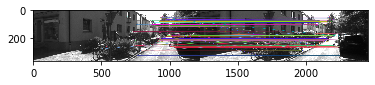

254


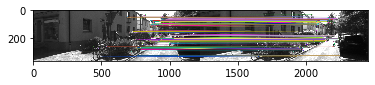

##########################################################################
151


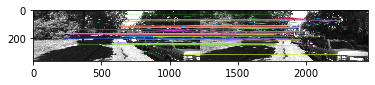

216


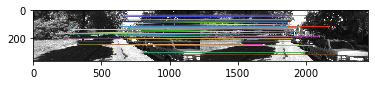

##########################################################################
[[(1109, 2059), (875, 1408), (1626, 2682), (1400, 2170), (510, 1022), (566, 779), (988, 1689), (565, 1207), (963, 1436), (1050, 1706), (648, 1189), (1248, 2113)], [(1074, 857), (1094, 721), (1497, 986), (1292, 872), (540, 367), (599, 479), (888, 672), (541, 391), (1424, 958), (1146, 691), (629, 474), (1262, 907)], [(1149, 1256), (1104, 1181), (1355, 1525), (1412, 1481), (778, 868), (1168, 1194), (968, 1006), (585, 626), (1389, 1512), (1248, 1334), (780, 855), (993, 1114)], [(185, 292), (419, 568), (271, 412), (378, 537), (193, 357), (457, 711), (209, 310), (121, 200), (414, 606), (264, 347), (154, 254), (151, 216)]]


In [8]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        orb = cv2.ORB_create(nfeatures=1500)
        kp1, des1 = orb.detectAndCompute(img1, None)
        kp2, des2 = orb.detectAndCompute(img2, None)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)

********************************************************************
236


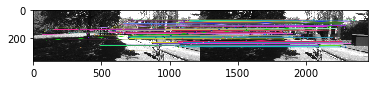

298


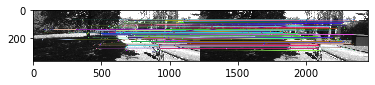

##########################################################################
175


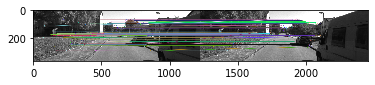

202


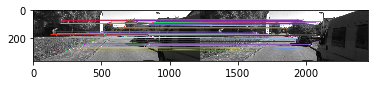

##########################################################################
249


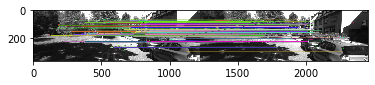

294


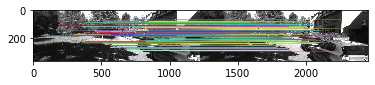

##########################################################################
229


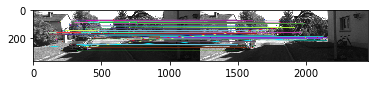

282


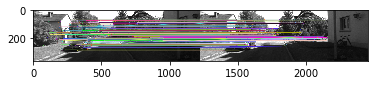

##########################################################################
124


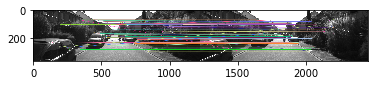

159


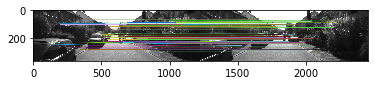

##########################################################################
117


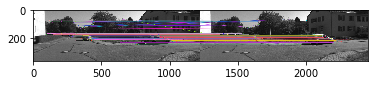

132


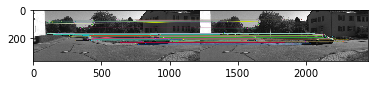

##########################################################################
286


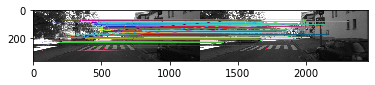

319


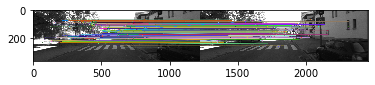

##########################################################################
155


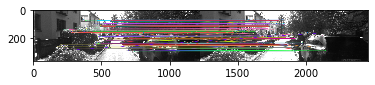

221


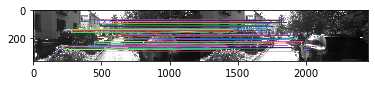

##########################################################################
148


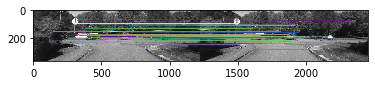

175


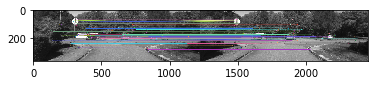

##########################################################################
143


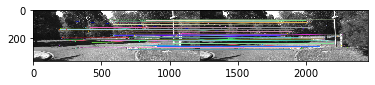

162


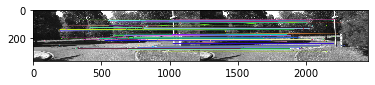

##########################################################################
117


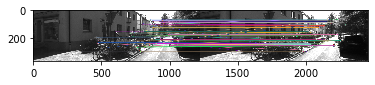

156


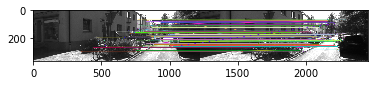

##########################################################################
275


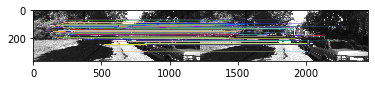

345


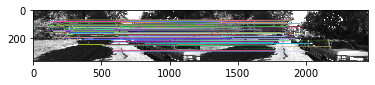

##########################################################################
[[(1109, 2059), (875, 1408), (1626, 2682), (1400, 2170), (510, 1022), (566, 779), (988, 1689), (565, 1207), (963, 1436), (1050, 1706), (648, 1189), (1248, 2113)], [(1074, 857), (1094, 721), (1497, 986), (1292, 872), (540, 367), (599, 479), (888, 672), (541, 391), (1424, 958), (1146, 691), (629, 474), (1262, 907)], [(1149, 1256), (1104, 1181), (1355, 1525), (1412, 1481), (778, 868), (1168, 1194), (968, 1006), (585, 626), (1389, 1512), (1248, 1334), (780, 855), (993, 1114)], [(185, 292), (419, 568), (271, 412), (378, 537), (193, 357), (457, 711), (209, 310), (121, 200), (414, 606), (264, 347), (154, 254), (151, 216)], [(236, 298), (175, 202), (249, 294), (229, 282), (124, 159), (117, 132), (286, 319), (155, 221), (148, 175), (143, 162), (117, 156), (275, 345)]]


In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
even = 0
odd = 1
method_goods=[]
for root,dirs,files in os.walk("./test"):
    path = root.split(os.sep)
    files.sort(key = lambda f: int(''.join(filter(str.isdigit, f))))
    print("********************************************************************")
    for file in files: 
        if(even%2==0):
            img1 = cv2.imread(root + '/' + file, 0) 
            even +=1
            continue
        img2 = cv2.imread(root + '/' + file, 0)
        even += 1
        
        # Initiate FAST detector
        star = cv2.xfeatures2d.StarDetector_create()
        # Initiate BRIEF extractor
        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        # find the keypoints with STAR
        kp1 = star.detect(img1,None)
        kp2 = star.detect(img2,None)
        # compute the descriptors with BRIEF
        kp1, des1 = brief.compute(img1, kp1)
        kp2, des2 = brief.compute(img2, kp2)
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2,k=2)
# Apply ratio test
        one_good_pair=()
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])
        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)
        plt.imshow(img3),plt.show()

        desc_tfeat1 = tfeat_utils.describe_opencv(tfeat, img1, kp1, 32,mag_factor)
        desc_tfeat2 = tfeat_utils.describe_opencv(tfeat, img2, kp2, 32,mag_factor)

        bf = cv2.BFMatcher()
        matches = bf.knnMatch(desc_tfeat1,desc_tfeat2, k=2)
        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.8*n.distance:
                good.append([m])

        print(len(good))
        one_good_pair = one_good_pair + (len(good),)
        method_goods.append(one_good_pair)
        img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,0, flags=2)

        plt.imshow(img3),plt.show()
        print("##########################################################################")
    all_good_matches.append(method_goods)
    print(all_good_matches)